In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
datadir = "/v/Data/cyto/mmNoComp/"
#datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/v/Data/cyto/mmNoComp/Fish6_CCB.mm', '/v/Data/cyto/mmNoComp/Fish6_untreated.mm', '/v/Data/cyto/mmNoComp/Fish6_ICE.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_CCB.mm', 'Fish6_untreated.mm', 'Fish6_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 256), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  626.0653 2.7638059 0.29222822


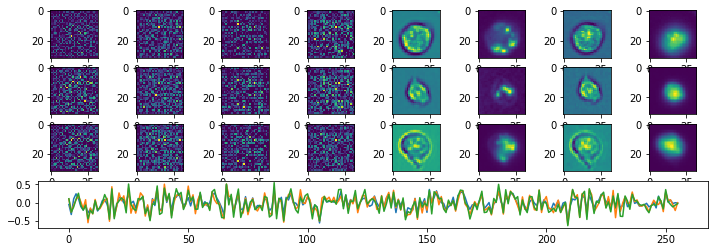

Epoch:  1 Iteration:  0 Loss:  17.456074 0.63778114 0.0011649132


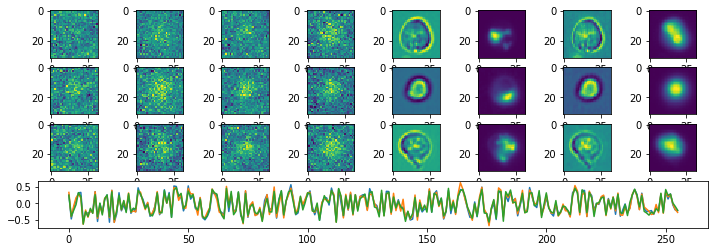

Epoch:  2 Iteration:  0 Loss:  16.003502 0.63683975 0.00039070845


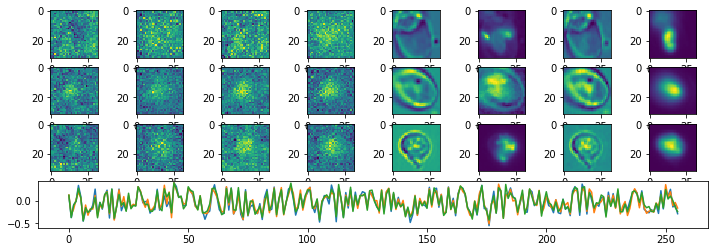

Epoch:  3 Iteration:  0 Loss:  12.634795 0.6351208 0.001737535


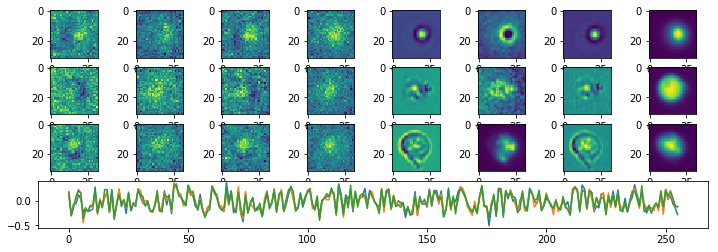

Epoch:  4 Iteration:  0 Loss:  11.371562 0.63447046 0.0017242134


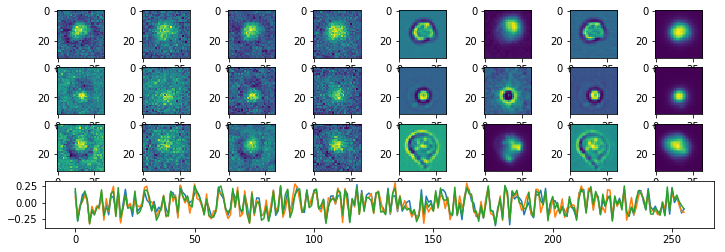

Epoch:  5 Iteration:  0 Loss:  10.339063 0.63393056 0.0015318394


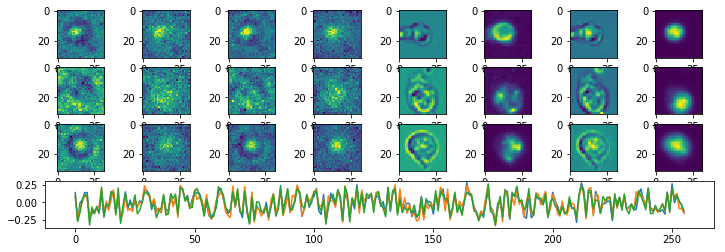

Epoch:  6 Iteration:  0 Loss:  9.481867 0.63347244 0.0012133718


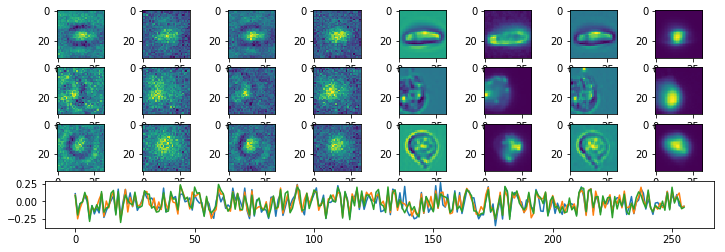

Epoch:  7 Iteration:  0 Loss:  8.810356 0.63312006 0.0017418861


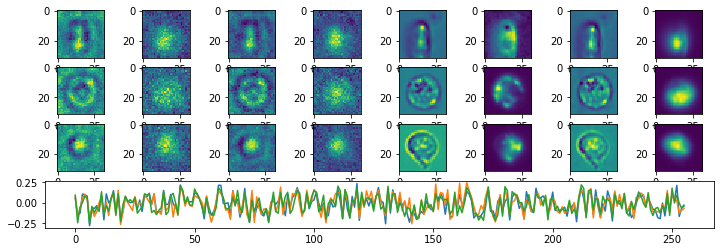

Epoch:  8 Iteration:  0 Loss:  7.898136 0.63263035 0.0009365976


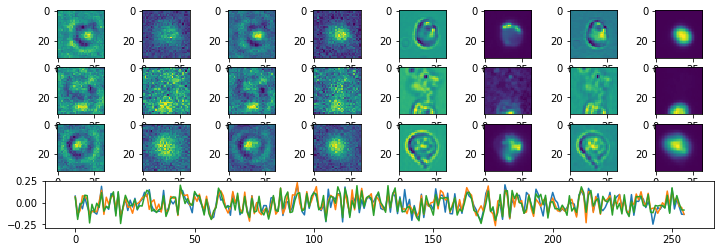

Epoch:  9 Iteration:  0 Loss:  7.4119515 0.6323748 0.0012109876


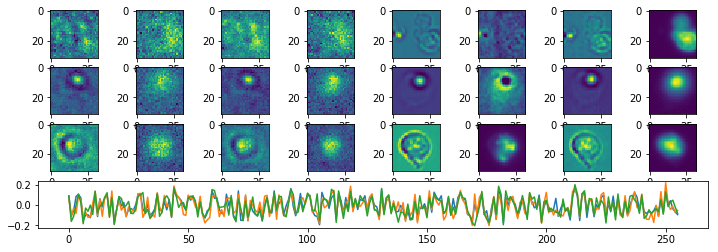

Epoch:  10 Iteration:  0 Loss:  7.1949377 0.63225985 0.0016743541


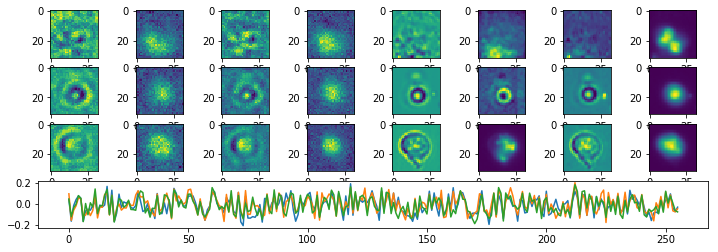

Epoch:  11 Iteration:  0 Loss:  6.599683 0.63194346 0.0010595322


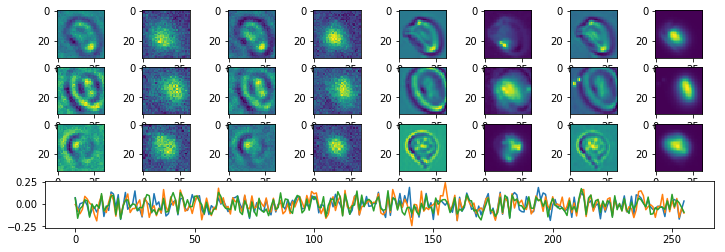

Epoch:  12 Iteration:  0 Loss:  6.3262777 0.6318002 0.0007709861


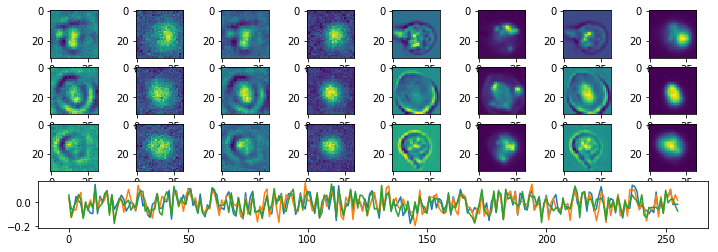

Epoch:  13 Iteration:  0 Loss:  6.076752 0.6316685 0.0009781718


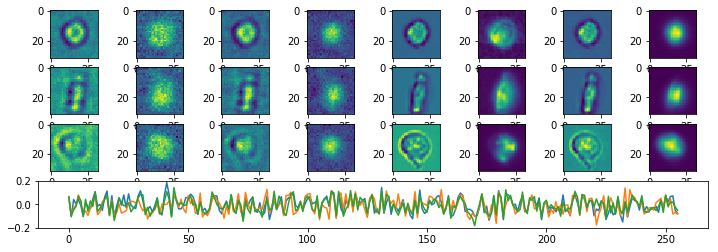

Epoch:  14 Iteration:  0 Loss:  5.864624 0.63155746 0.0013205409


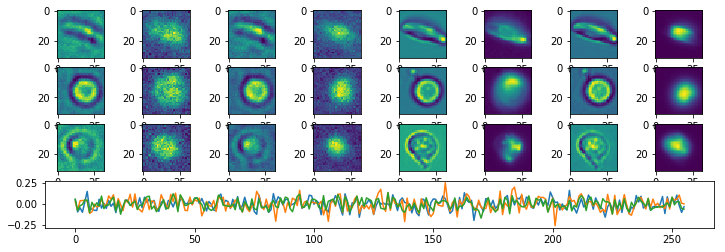

Epoch:  15 Iteration:  0 Loss:  5.6365232 0.6314391 0.0011101365


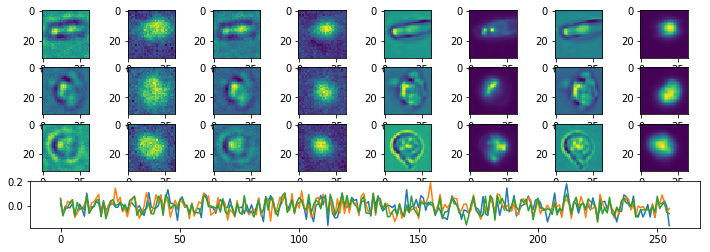

Epoch:  16 Iteration:  0 Loss:  5.4515395 0.63134164 0.0007187128


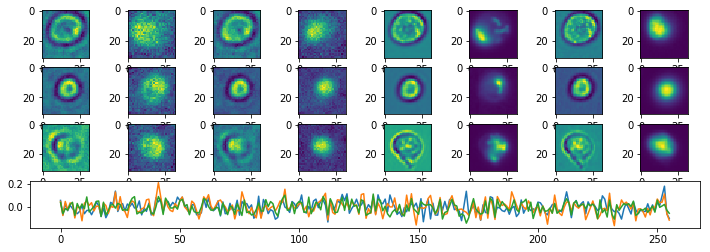

Epoch:  17 Iteration:  0 Loss:  5.2658653 0.6312382 0.00075379014


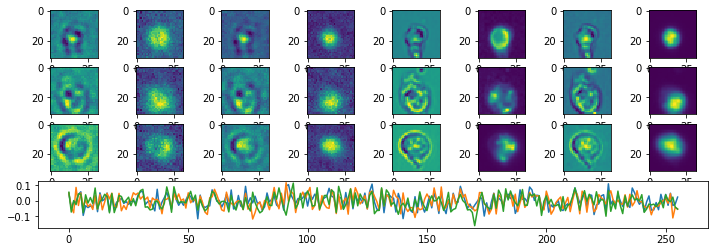

Epoch:  18 Iteration:  0 Loss:  5.054761 0.63113105 0.0009724498


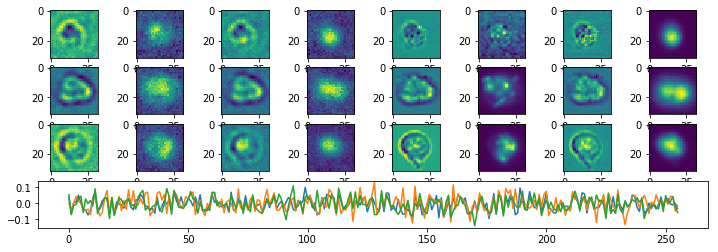

Epoch:  19 Iteration:  0 Loss:  4.907115 0.6310544 0.0009561181


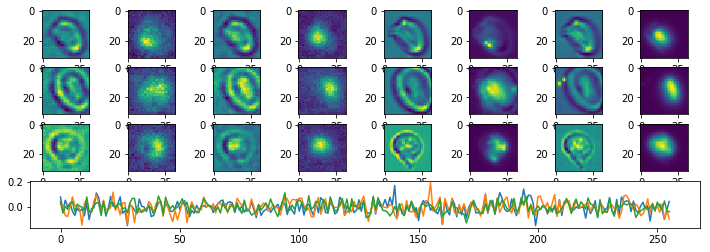

Epoch:  20 Iteration:  0 Loss:  4.7741137 0.63097703 0.0011775494


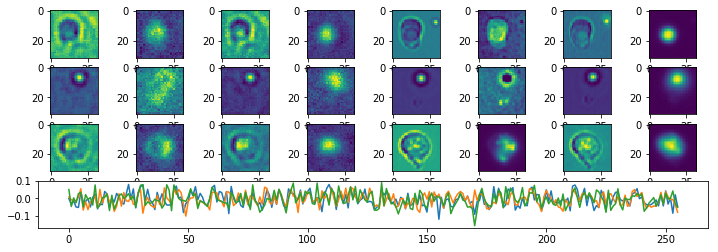

Epoch:  21 Iteration:  0 Loss:  4.61466 0.63089323 0.000605464


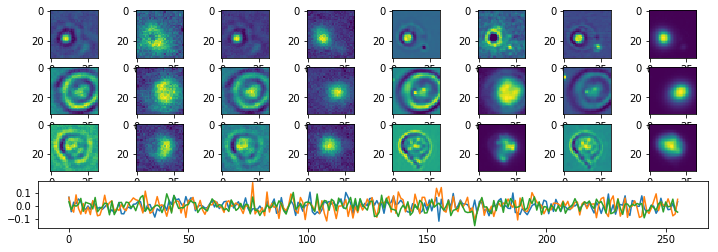

Epoch:  22 Iteration:  0 Loss:  4.4973116 0.63082933 0.00071939826


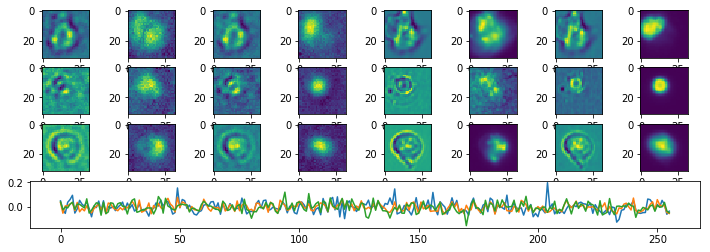

Epoch:  23 Iteration:  0 Loss:  4.3531227 0.6307549 0.00039714575


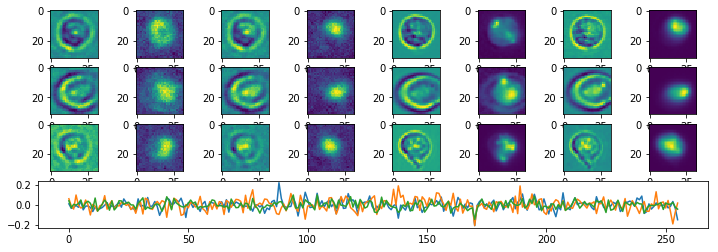

Epoch:  24 Iteration:  0 Loss:  4.243804 0.63069797 0.000692755


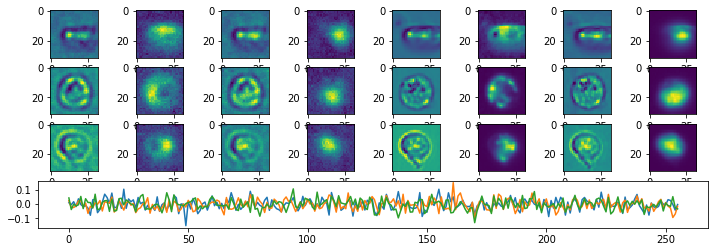

Epoch:  25 Iteration:  0 Loss:  4.1789055 0.6306629 0.00028175116


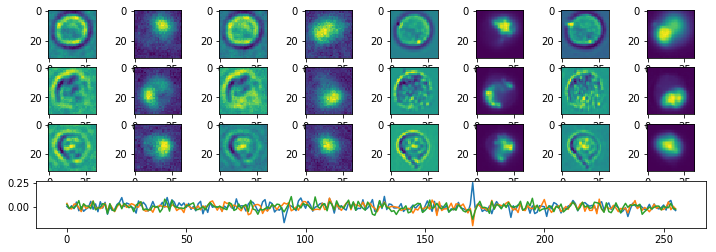

Epoch:  26 Iteration:  0 Loss:  4.0723124 0.6306057 0.00026839972


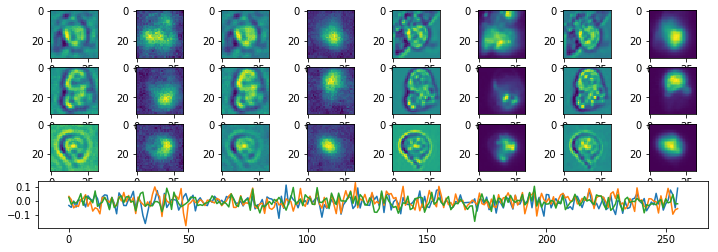

Epoch:  27 Iteration:  0 Loss:  4.0129642 0.6305758 0.0004917383


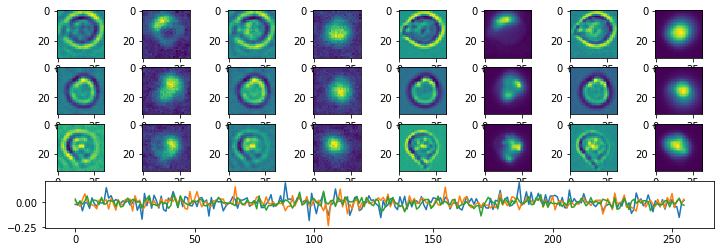

Epoch:  28 Iteration:  0 Loss:  3.9038568 0.6305177 0.00055366755


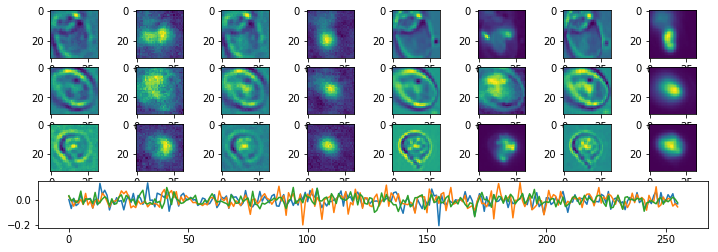

Epoch:  29 Iteration:  0 Loss:  3.8453174 0.630486 0.00041124225


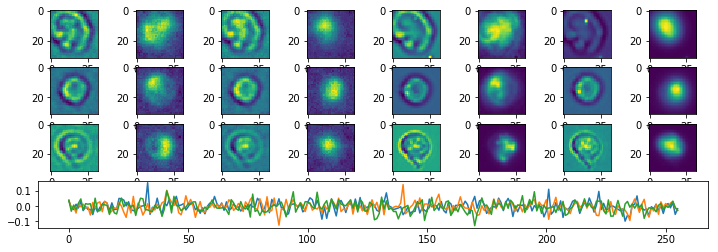

Epoch:  30 Iteration:  0 Loss:  3.7552805 0.6304408 0.00042310357


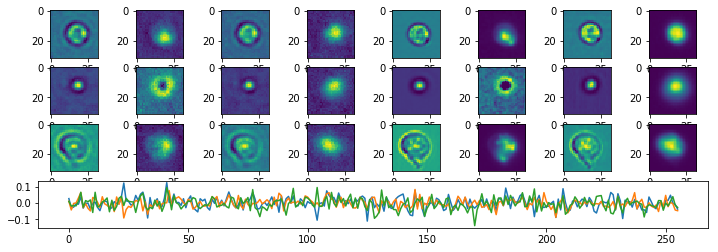

Epoch:  31 Iteration:  0 Loss:  3.6852398 0.6304019 0.0007470548


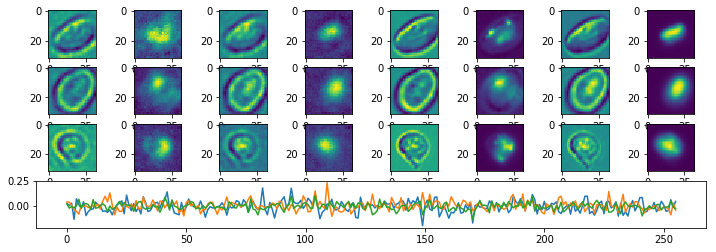

Epoch:  32 Iteration:  0 Loss:  3.6572623 0.63038695 0.0003992319


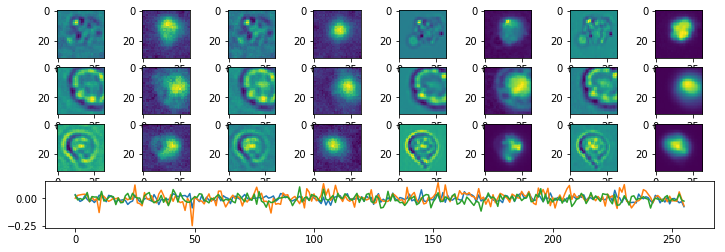

Epoch:  33 Iteration:  0 Loss:  3.6299179 0.63037646 0.0002670586


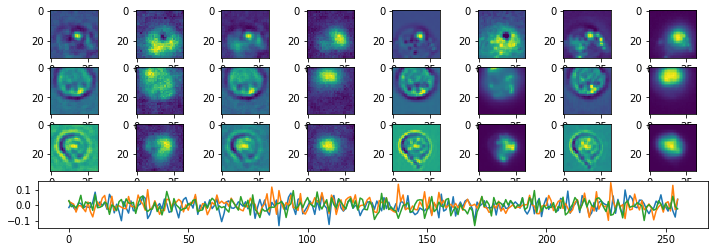

Epoch:  34 Iteration:  0 Loss:  3.5237226 0.63031715 0.00080639124


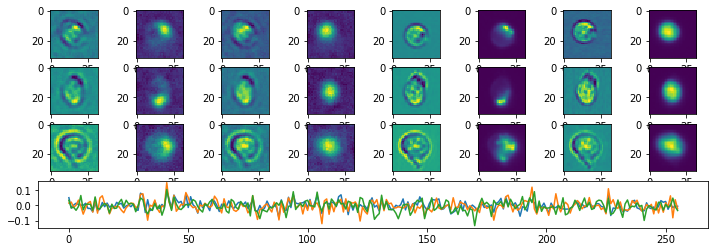

Epoch:  35 Iteration:  0 Loss:  3.4758945 0.630292 0.00062584877


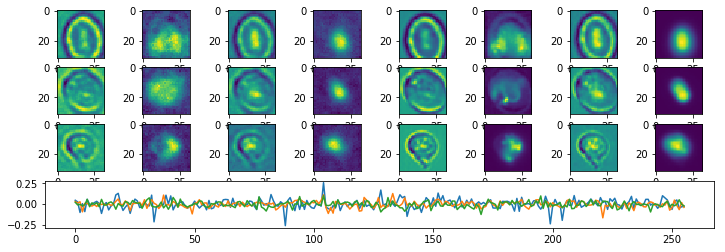

Epoch:  36 Iteration:  0 Loss:  3.4342475 0.6302708 0.0005737543


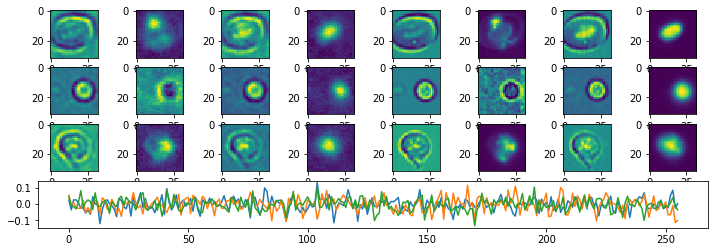

Epoch:  37 Iteration:  0 Loss:  3.3741612 0.6302384 0.00062549114


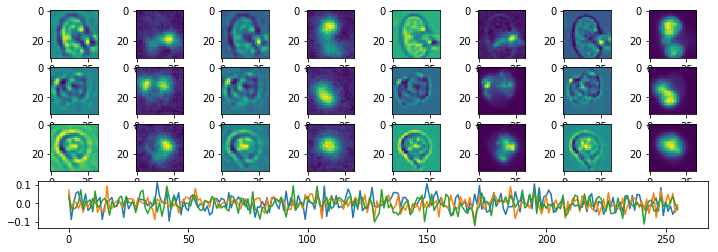

Epoch:  38 Iteration:  0 Loss:  3.322997 0.630212 0.000878036


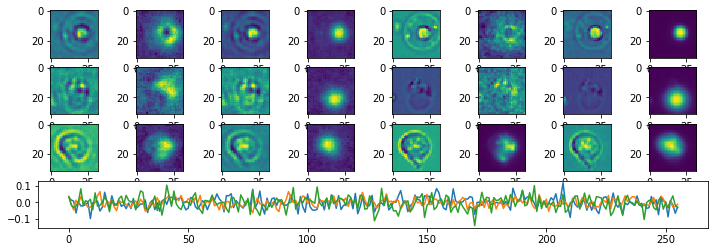

Epoch:  39 Iteration:  0 Loss:  3.282738 0.63019085 0.00058564544


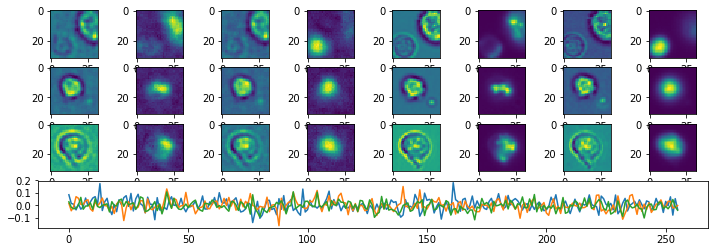

Epoch:  40 Iteration:  0 Loss:  3.2396066 0.63016874 0.00033771992


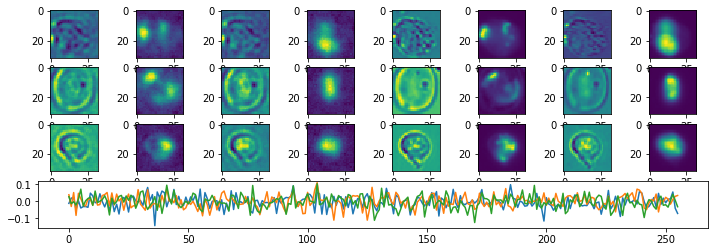

Epoch:  41 Iteration:  0 Loss:  3.1949382 0.63014555 0.00011444092


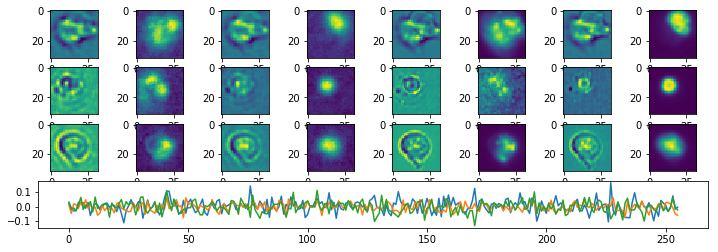

Epoch:  42 Iteration:  0 Loss:  3.2101872 0.63015294 7.942319e-05


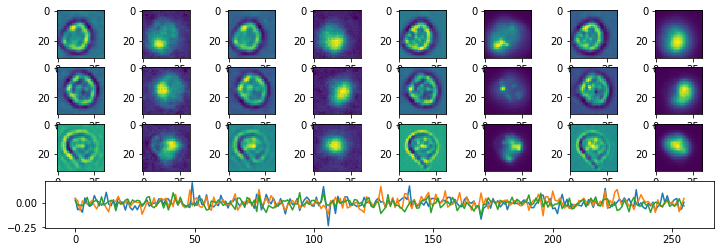

Epoch:  43 Iteration:  0 Loss:  3.142931 0.63011825 0.00058317184


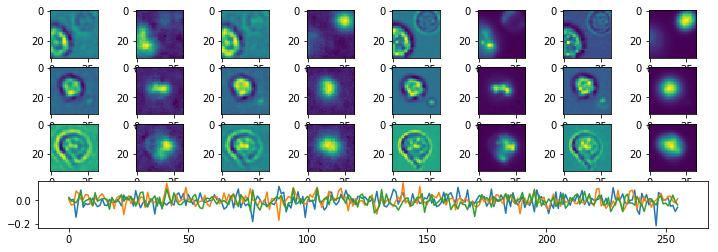

Epoch:  44 Iteration:  0 Loss:  3.0998087 0.6300962 0.0002849698


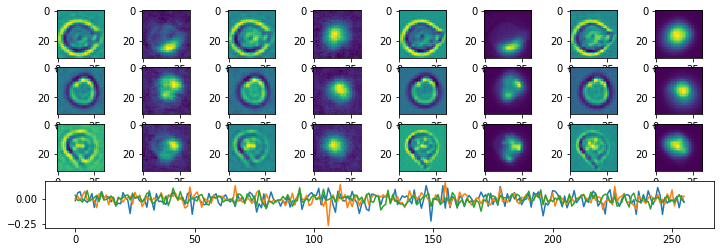

Epoch:  45 Iteration:  0 Loss:  3.0834577 0.6300875 0.00034305453


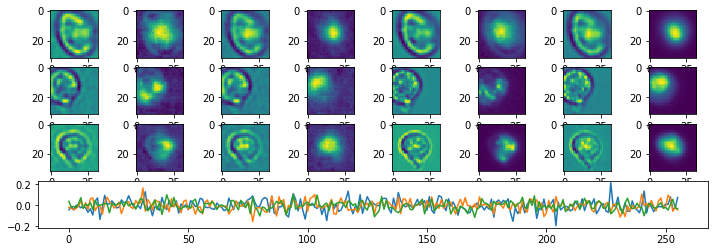

Epoch:  46 Iteration:  0 Loss:  3.032546 0.6300603 0.00053983927


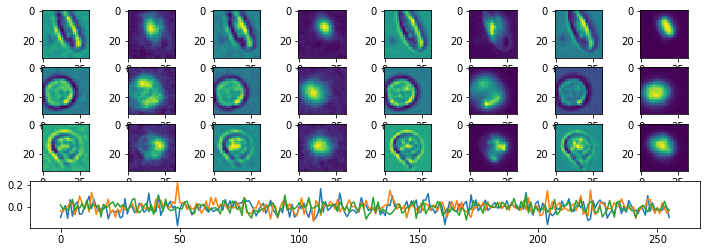

Epoch:  47 Iteration:  0 Loss:  2.9828558 0.63003546 7.83205e-05


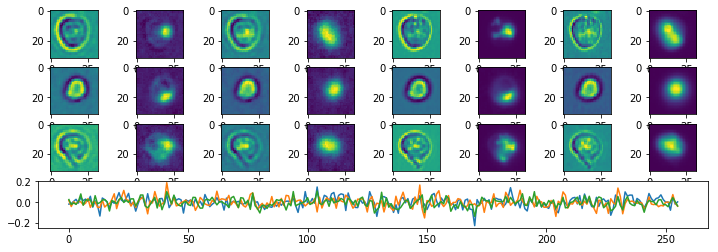

Epoch:  48 Iteration:  0 Loss:  2.998407 0.6300432 0.00034308434


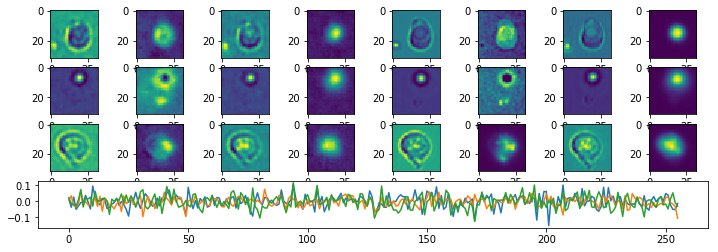

Epoch:  49 Iteration:  0 Loss:  2.949658 0.6300183 0.00021967292


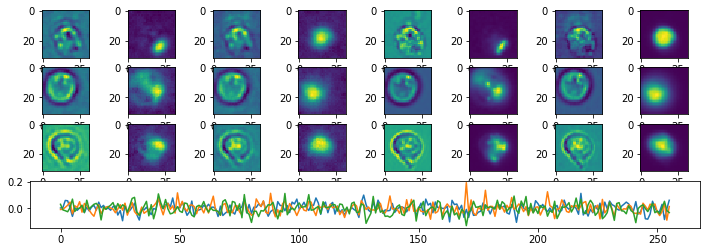

Epoch:  50 Iteration:  0 Loss:  2.944735 0.6300154 1.21593475e-05


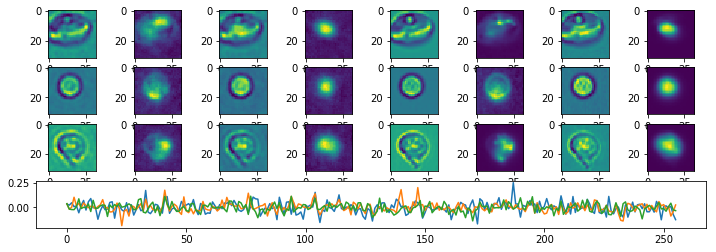

Epoch:  51 Iteration:  0 Loss:  2.8911686 0.6299878 0.00044825673


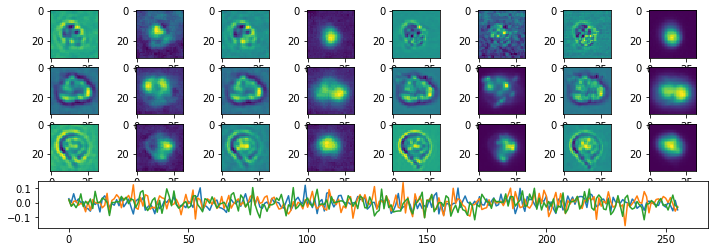

Epoch:  52 Iteration:  0 Loss:  2.8479788 0.62996554 0.00035864115


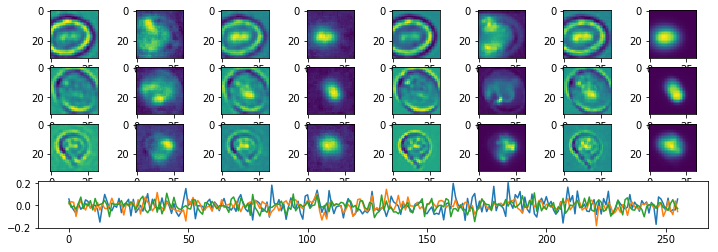

Epoch:  53 Iteration:  0 Loss:  2.8384523 0.62996143 8.08239e-05


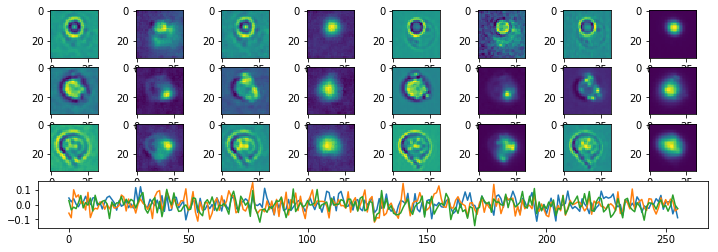

Epoch:  54 Iteration:  0 Loss:  2.8024406 0.6299425 0.00021478534


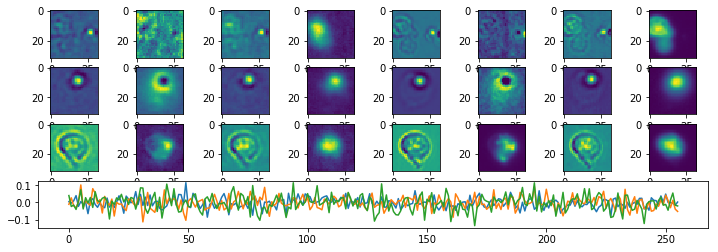

Epoch:  55 Iteration:  0 Loss:  2.7830415 0.6299326 0.00012424588


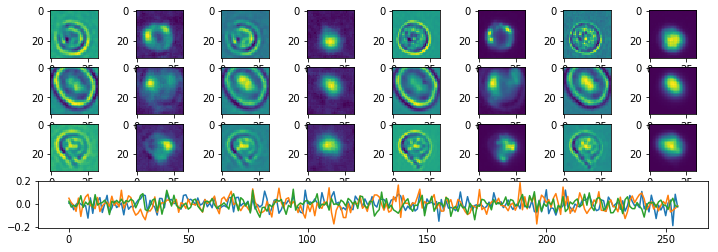

Epoch:  56 Iteration:  0 Loss:  2.7515676 0.62991583 0.00042697787


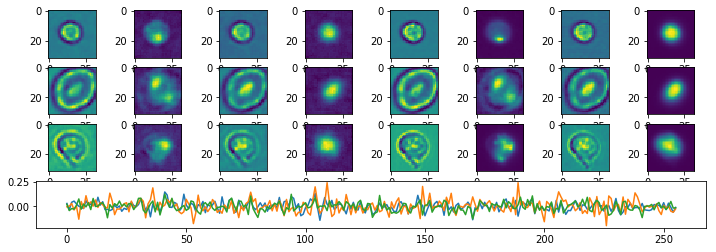

Epoch:  57 Iteration:  0 Loss:  2.723014 0.62990165 0.00012993813


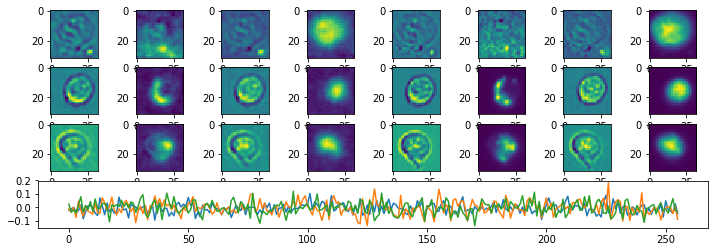

Epoch:  58 Iteration:  0 Loss:  2.7099547 0.6298949 0.00016731024


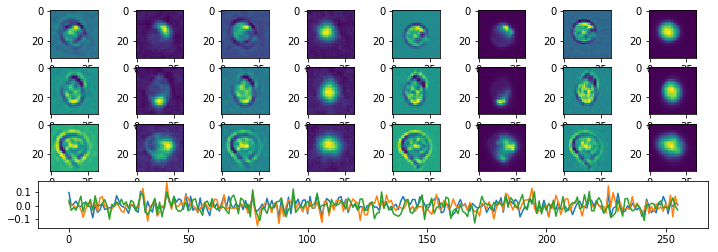

Epoch:  59 Iteration:  0 Loss:  2.6853728 0.6298822 0.00014019012


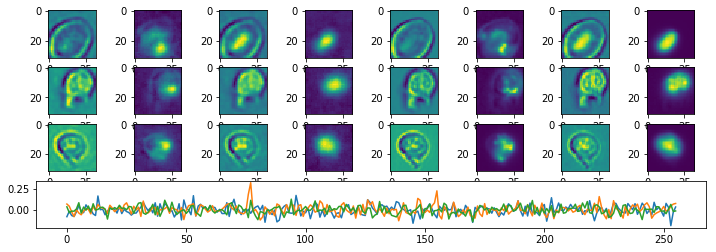

Epoch:  60 Iteration:  0 Loss:  2.6525512 0.6298644 0.00050246716


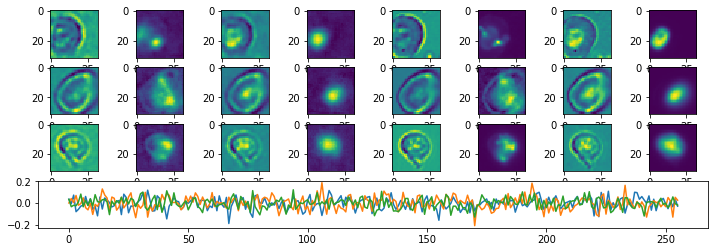

Epoch:  61 Iteration:  0 Loss:  2.6357698 0.62985575 4.5776367e-05


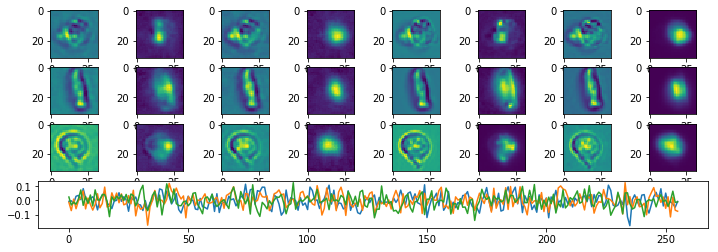

Epoch:  62 Iteration:  0 Loss:  2.6158648 0.62984633 0.00026929379


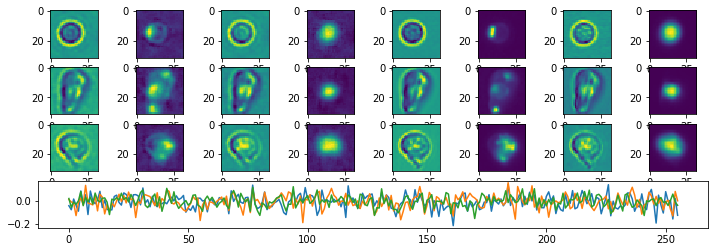

Epoch:  63 Iteration:  0 Loss:  2.618457 0.62984645 3.9815903e-05


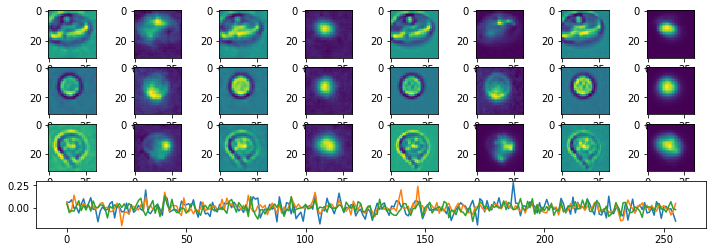

Epoch:  64 Iteration:  0 Loss:  2.5904355 0.6298331 9.447336e-05


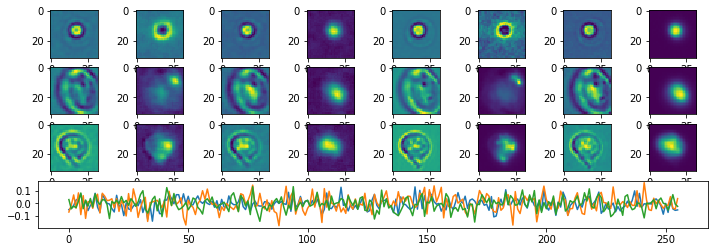

Epoch:  65 Iteration:  0 Loss:  2.605112 0.62983966 0.00033587217


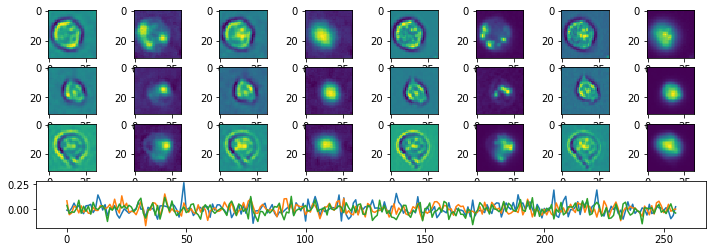

Epoch:  66 Iteration:  0 Loss:  2.59861 0.6298363 0.00038325787


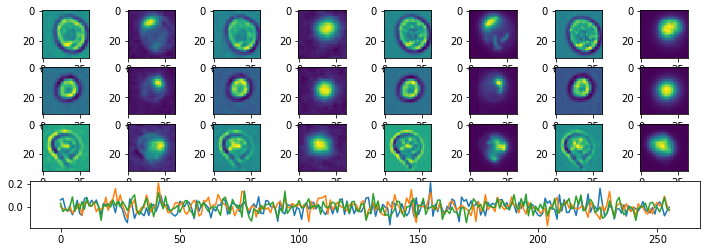

Epoch:  67 Iteration:  0 Loss:  2.5626059 0.6298201 5.698204e-05


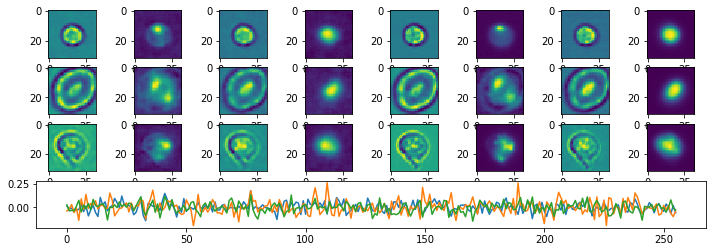

Epoch:  68 Iteration:  0 Loss:  2.5300865 0.62980133 0.00038468838


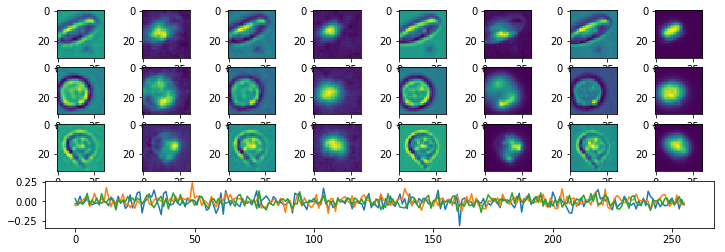

Epoch:  69 Iteration:  0 Loss:  2.5060544 0.62978876 0.00016331673


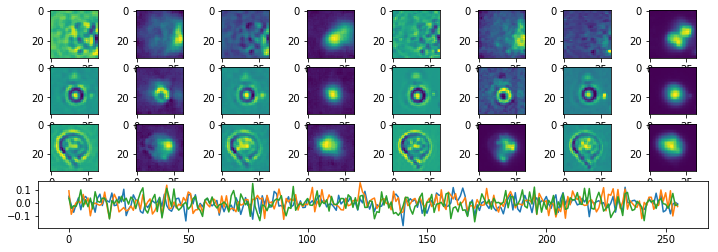

Epoch:  70 Iteration:  0 Loss:  2.5171938 0.6297951 0.0003194809


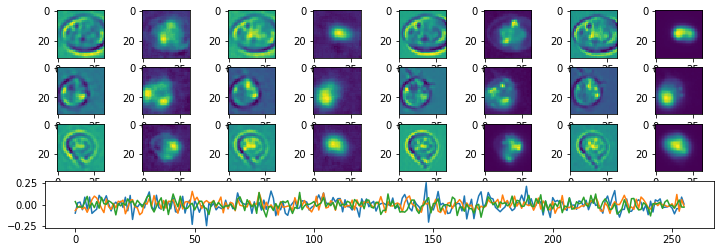

Epoch:  71 Iteration:  0 Loss:  2.479674 0.62977517 0.00030702353


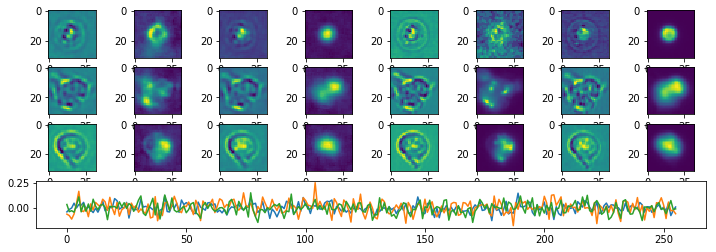

Epoch:  72 Iteration:  0 Loss:  2.4656324 0.62976766 0.0003246367


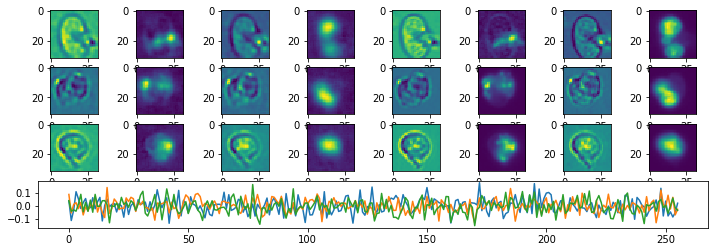

Epoch:  73 Iteration:  0 Loss:  2.4781616 0.62977505 0.00016152859


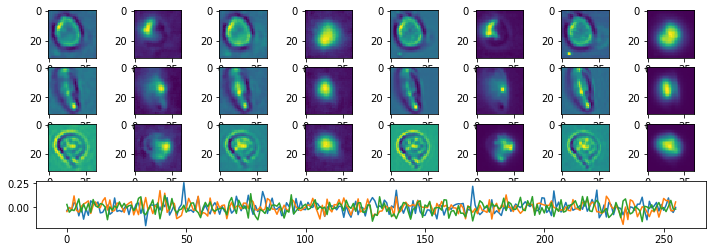

Epoch:  74 Iteration:  0 Loss:  2.4635596 0.62976694 3.835559e-05


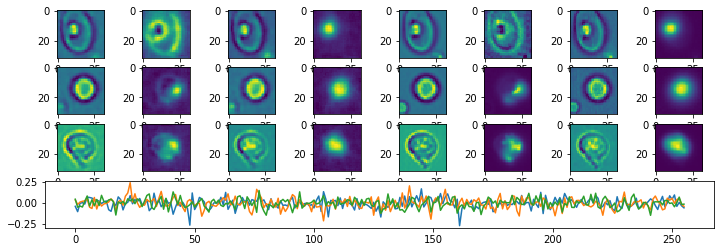

Epoch:  75 Iteration:  0 Loss:  2.6455579 0.62986344 0.00020548701


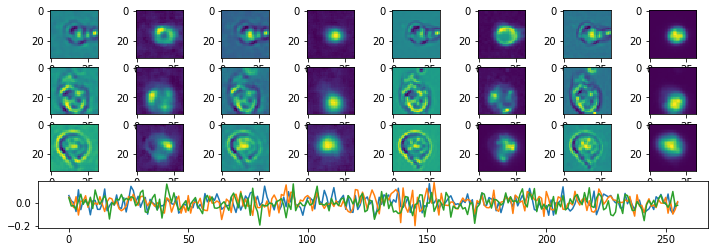

Epoch:  76 Iteration:  0 Loss:  2.465727 0.6297686 0.00024569035


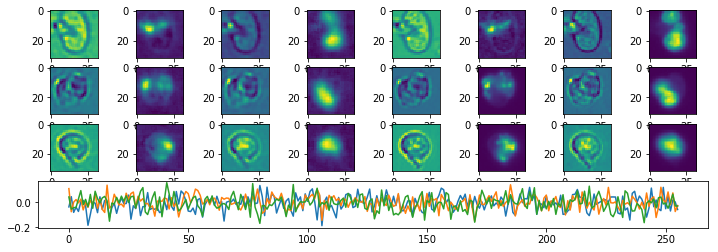

Epoch:  77 Iteration:  0 Loss:  2.4579911 0.6297646 0.00014421344


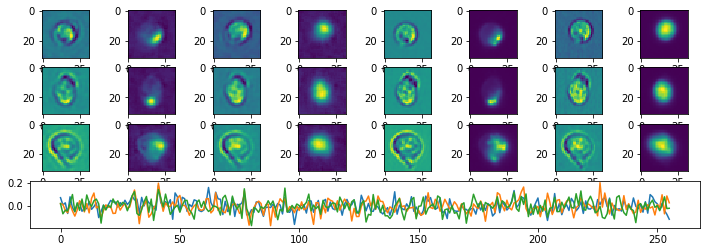

Epoch:  78 Iteration:  0 Loss:  2.413247 0.62974143 0.00016003847


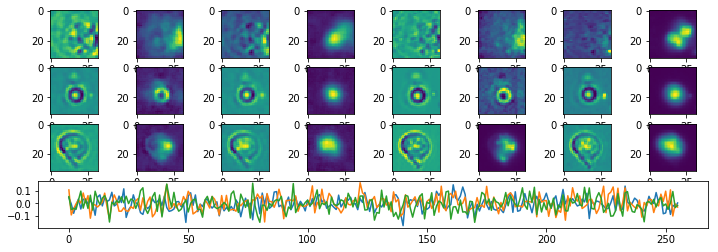

Epoch:  79 Iteration:  0 Loss:  2.4046693 0.62973696 0.0002719462


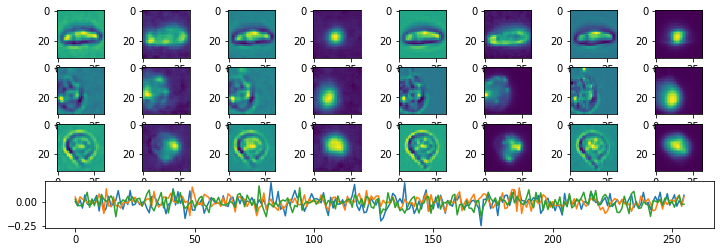

Epoch:  80 Iteration:  0 Loss:  2.4335227 0.629751 5.9217215e-05


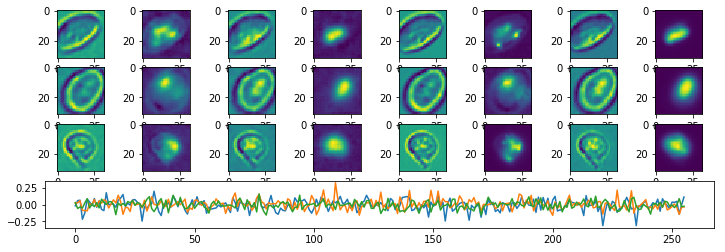

Epoch:  81 Iteration:  0 Loss:  2.3995838 0.6297335 0.00032550097


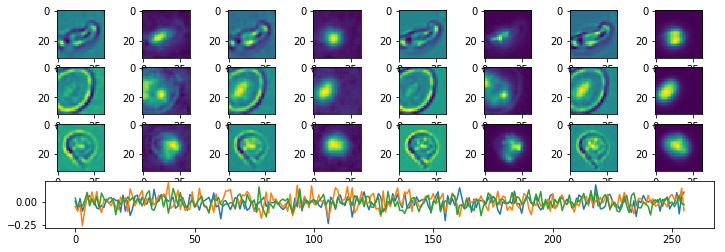

Epoch:  82 Iteration:  0 Loss:  2.3701124 0.62971795 0.00033164024


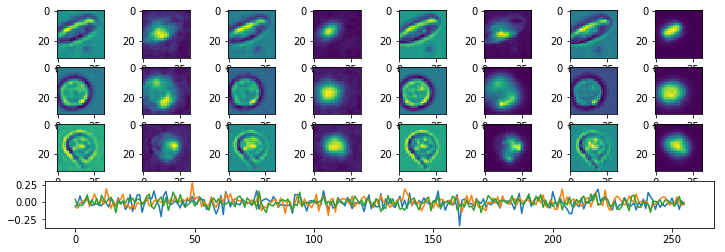

Epoch:  83 Iteration:  0 Loss:  2.393425 0.62973076 3.9696693e-05


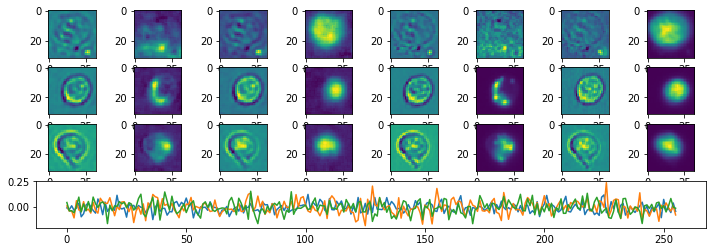

Epoch:  84 Iteration:  0 Loss:  2.4006743 0.6297343 0.0002053082


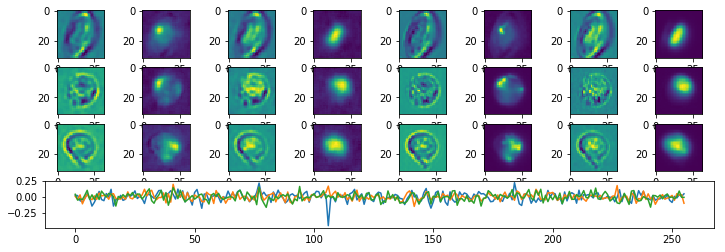

Epoch:  85 Iteration:  0 Loss:  2.383038 0.6297252 0.0002169311


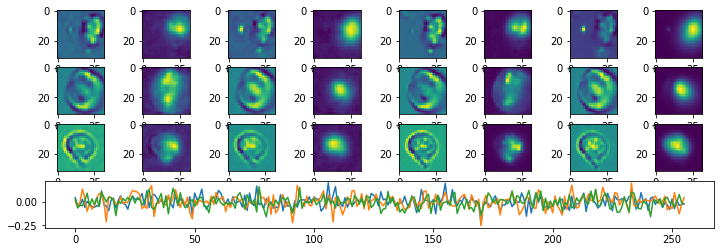

Epoch:  86 Iteration:  0 Loss:  3.2645178 0.63018686 0.0004892349


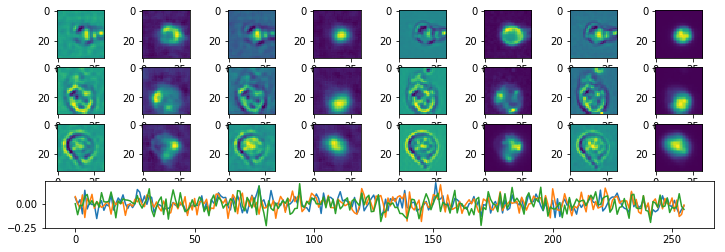

Epoch:  87 Iteration:  0 Loss:  2.9519448 0.6300237 0.00031855702


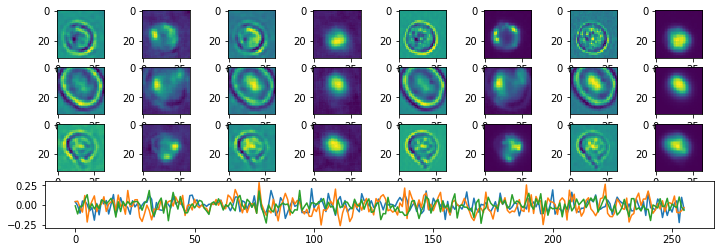

Epoch:  88 Iteration:  0 Loss:  2.8169794 0.6299515 0.00042527914


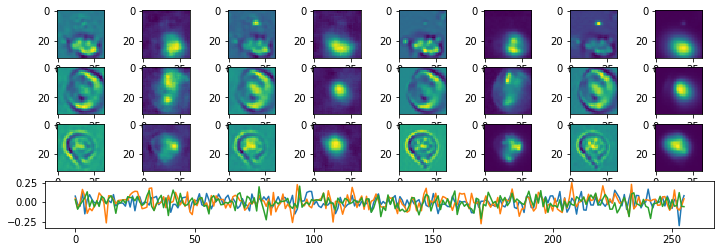

Epoch:  89 Iteration:  0 Loss:  2.7430344 0.62991405 0.00026768446


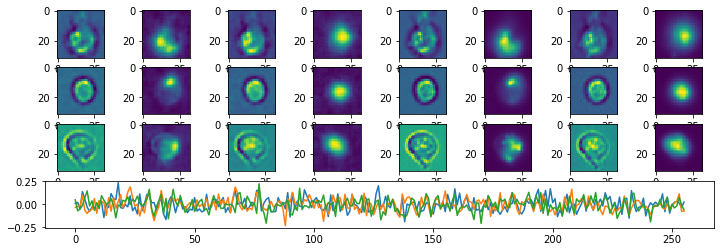

Epoch:  90 Iteration:  0 Loss:  2.6724255 0.62987554 0.00035062432


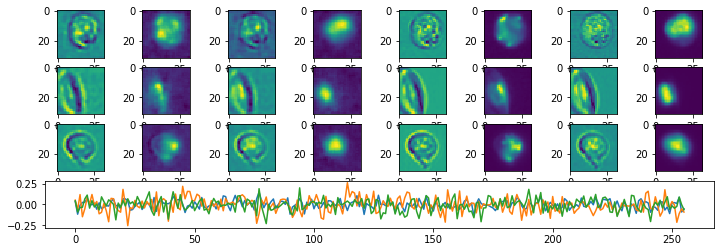

Epoch:  91 Iteration:  0 Loss:  2.6396303 0.6298604 0.0004003942


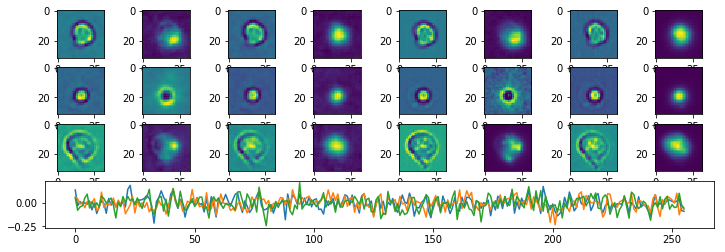

Epoch:  92 Iteration:  0 Loss:  2.6016805 0.6298386 0.00036805868


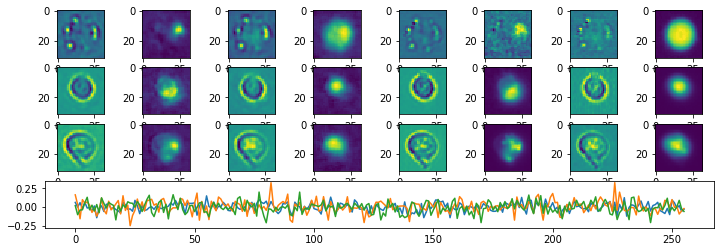

Epoch:  93 Iteration:  0 Loss:  2.5773864 0.62982595 0.00033134222


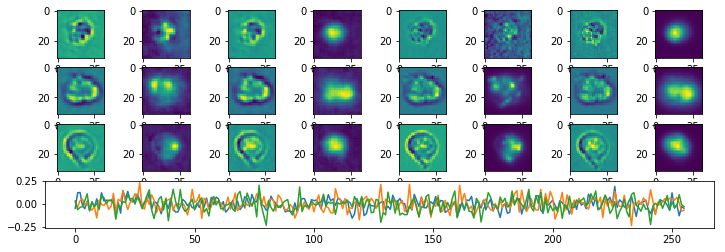

Epoch:  94 Iteration:  0 Loss:  2.5390842 0.6298069 0.0003261268


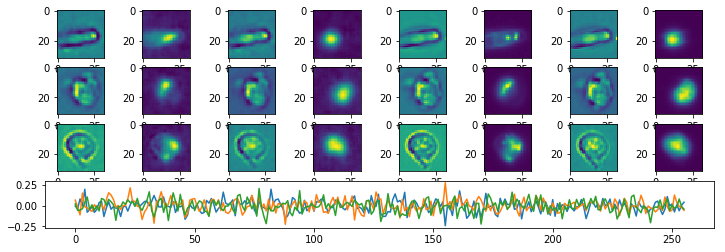

Epoch:  95 Iteration:  0 Loss:  2.5186472 0.62979555 0.0001861453


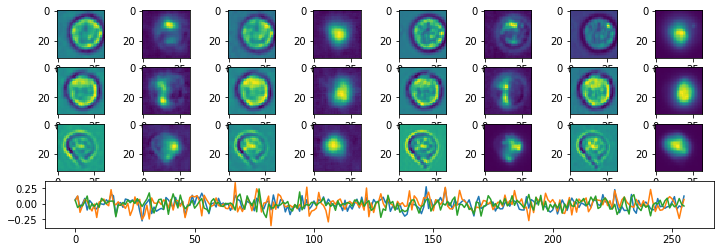

Epoch:  96 Iteration:  0 Loss:  2.5007763 0.6297858 0.00028946996


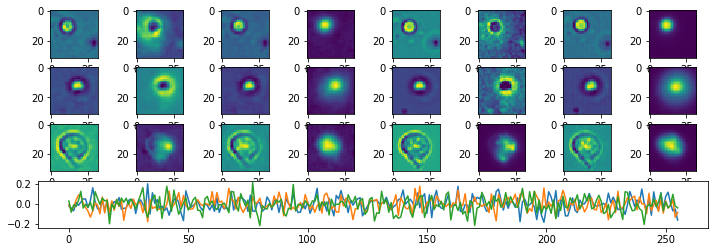

Epoch:  97 Iteration:  0 Loss:  2.4911823 0.6297811 0.00022262335


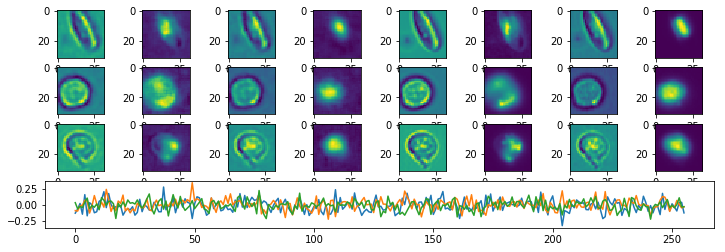

Epoch:  98 Iteration:  0 Loss:  2.4689083 0.6297694 0.00019451976


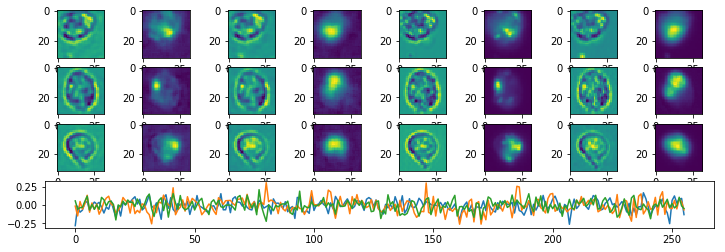

Epoch:  99 Iteration:  0 Loss:  2.4535775 0.6297618 0.00022143126


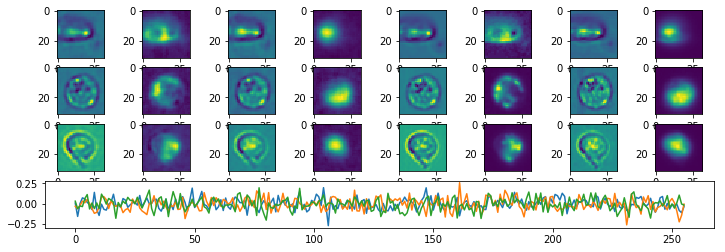

Epoch:  100 Iteration:  0 Loss:  2.438331 0.62975323 0.00020581484


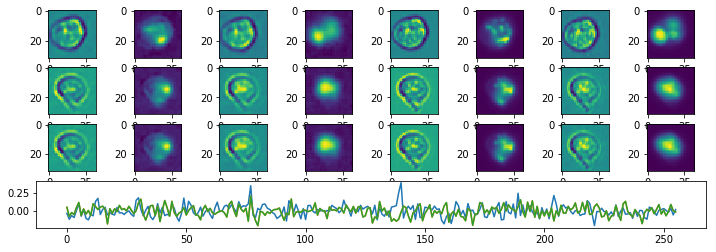

Epoch:  101 Iteration:  0 Loss:  2.4291782 0.62974834 0.00027397275


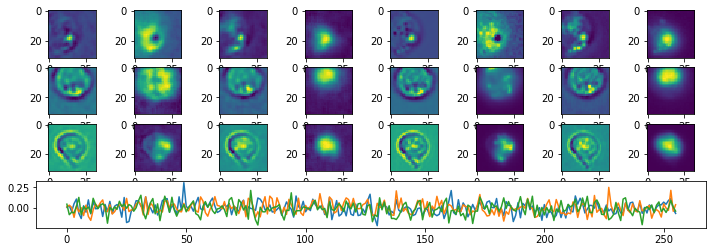

Epoch:  102 Iteration:  0 Loss:  2.4148211 0.62974155 0.00019493699


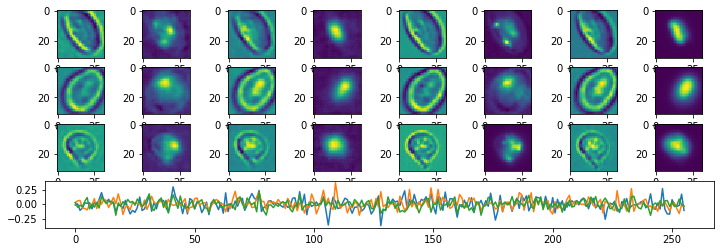

Epoch:  103 Iteration:  0 Loss:  2.4113355 0.6297396 0.00022625923


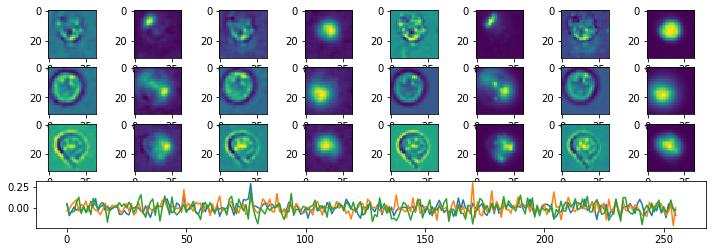

Epoch:  104 Iteration:  0 Loss:  2.4001594 0.6297333 0.00027948618


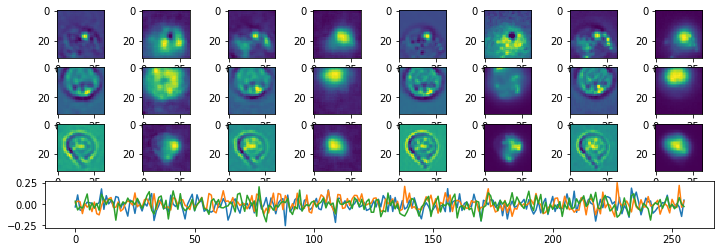

Epoch:  105 Iteration:  0 Loss:  2.3822775 0.6297248 0.00014185905


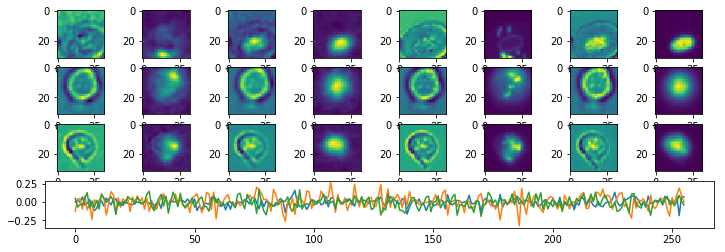

Epoch:  106 Iteration:  0 Loss:  2.390964 0.6297288 0.00021979213


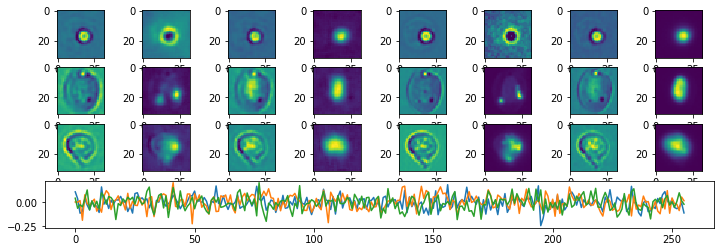

Epoch:  107 Iteration:  0 Loss:  2.3868153 0.6297271 0.00025516748


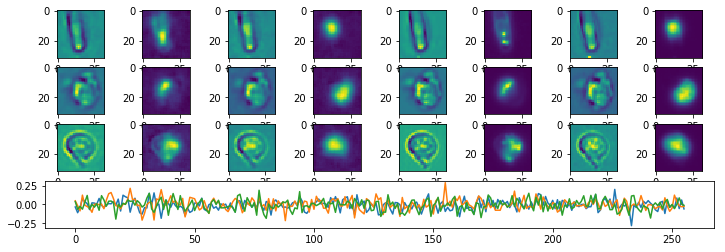

Epoch:  108 Iteration:  0 Loss:  2.3657928 0.6297157 0.0002823472


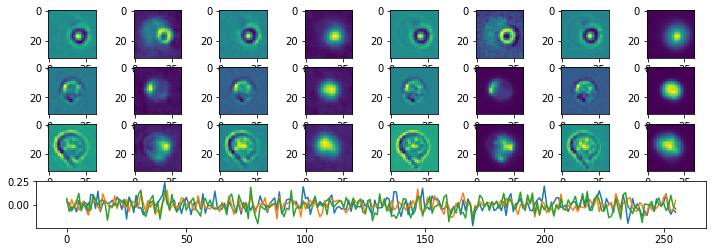

Epoch:  109 Iteration:  0 Loss:  2.3589907 0.6297122 0.00022742152


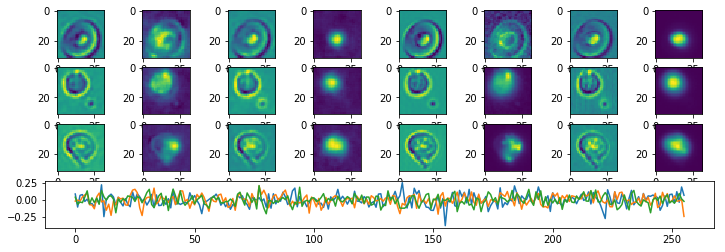

Epoch:  110 Iteration:  0 Loss:  2.3415594 0.62970316 0.00015556812


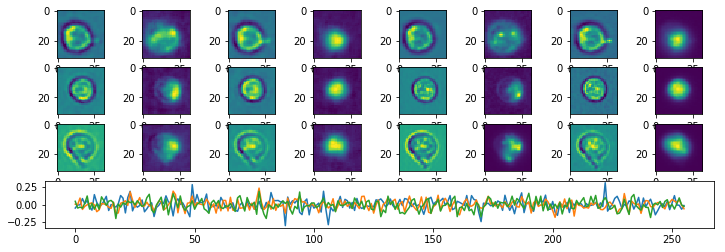

Epoch:  111 Iteration:  0 Loss:  2.3387585 0.6297016 0.00016605854


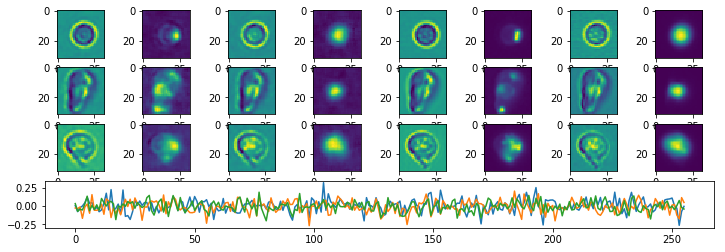

Epoch:  112 Iteration:  0 Loss:  2.330319 0.6296968 0.00020331144


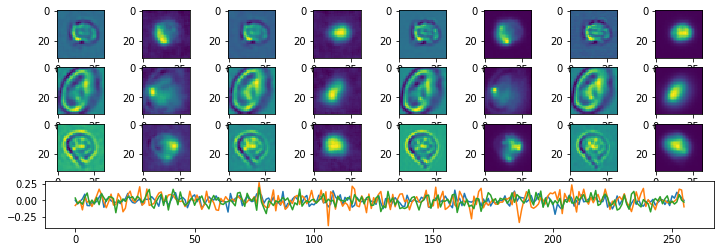

Epoch:  113 Iteration:  0 Loss:  2.3251364 0.6296942 0.00020343065


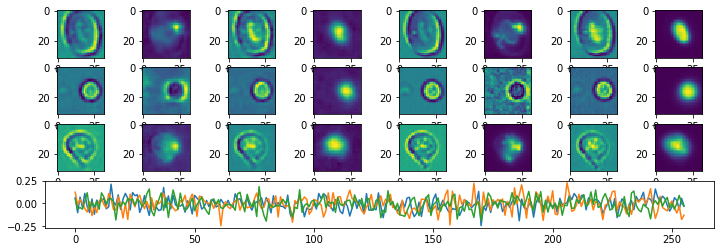

Epoch:  114 Iteration:  0 Loss:  2.3300157 0.6296972 0.00024282932


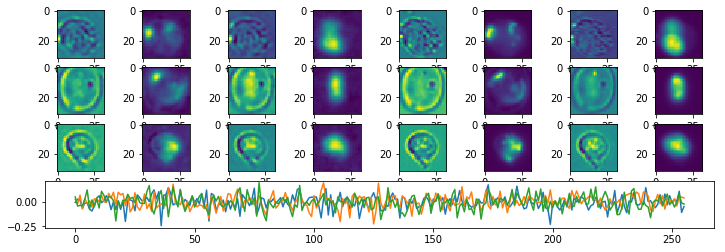

Epoch:  115 Iteration:  0 Loss:  2.3426208 0.6297041 0.00042319298


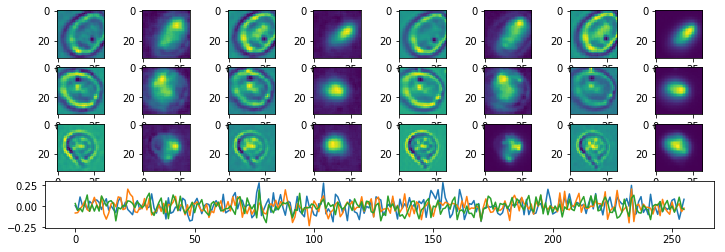

Epoch:  116 Iteration:  0 Loss:  2.3057652 0.629684 0.00030899048


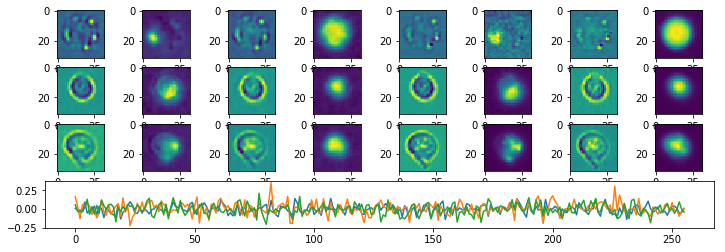

Epoch:  117 Iteration:  0 Loss:  2.3101163 0.6296864 0.0003002584


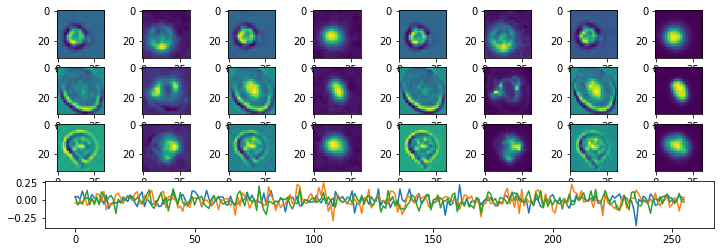

Epoch:  118 Iteration:  0 Loss:  2.2987328 0.6296805 0.00019946694


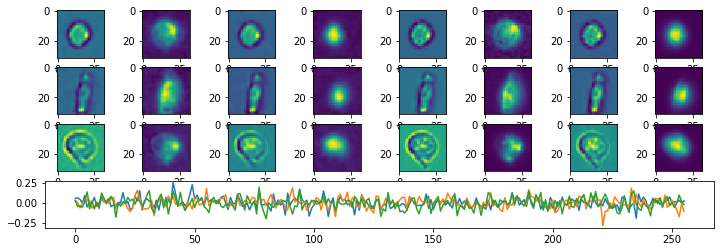

Epoch:  119 Iteration:  0 Loss:  2.300299 0.62968177 0.00020357966


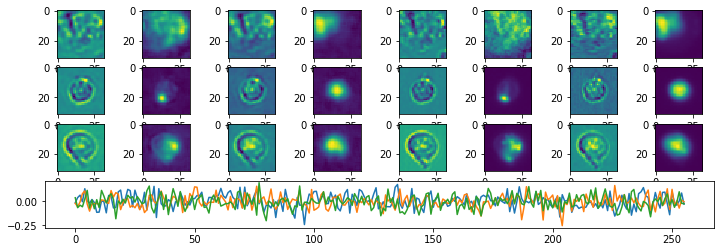

Done


In [5]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/v/Data/cyto/Checkpoints/2018-04-20-Chs-0-1-3-4_32_mmNoComp/"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4